# Section 1: Notebook Setup & Imports

This section initializes the environment, sets up path resolution, imports libraries for modeling and evaluation, and configures the random seed for reproducibility. We also verify CUDA availability for XGBoost.

In [1]:
import os
import sys
import random
import time
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score, root_mean_squared_error
import torch
import xgboost as xgb
from xgboost import XGBRegressor

def find_project_root():
    candidates = [Path.cwd().resolve(), *Path.cwd().resolve().parents]
    for cand in candidates:
        if (cand / "data").exists() and (cand / "d_models").exists():
            return cand
    raise FileNotFoundError("Could not locate repo root containing 'data'")

PROJECT_ROOT = find_project_root()
print(f"Project root found: {PROJECT_ROOT}")

# Append project root to sys.path
sys_path_root = str(PROJECT_ROOT)
if sys_path_root not in sys.path:
    sys.path.append(sys_path_root)

# Define out_dir globally for 1.3 hyperparameter sweep
out_dir = PROJECT_ROOT / "notebooks/experiment/derived_8.2-hyperparameters-1.3"
out_dir.mkdir(parents=True, exist_ok=True)
print(f"Output directory: {out_dir}")

import warnings
warnings.filterwarnings("ignore")

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)
print(f"Random seed set to {SEED}")

# Setup plotting style
plt.style.use("default")
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams["axes.grid"] = True

# Verify CUDA/GPU availability for XGBoost
try:
    dummy = xgb.XGBRegressor(n_estimators=1, device="cuda")
    dummy.fit(np.array([[1.0]]), np.array([1.0]))
    XGB_DEVICE = "cuda"
    print("XGBoost CUDA support verified and enabled.")
except Exception as e:
    XGB_DEVICE = "cpu"
    print(f"XGBoost CUDA test failed ({e}). Falling back to CPU.")

print("Setup complete. Using device:", XGB_DEVICE)


Project root found: C:\Users\pan\Documents\GitHub\MDR-Project
Output directory: C:\Users\pan\Documents\GitHub\MDR-Project\notebooks\experiment\derived_8.2-hyperparameters-1.3
Random seed set to 42
XGBoost CUDA support verified and enabled.
Setup complete. Using device: cuda


# Section 2: Data Loading & Preprocessing

This section loads the train, validation, and test splits for the Washington-only `derived_8.2` dataset. We concatenate the train and validation sets to form the `trainval` split for model training, parse dates, and extract month and year features.

In [2]:
# Define path configurations
TRAIN_PATH = PROJECT_ROOT / "data/splits/derived_8.2/train.csv"
VAL_PATH = PROJECT_ROOT / "data/splits/derived_8.2/val.csv"
TEST_PATH = PROJECT_ROOT / "data/splits/derived_8.2/test.csv"

# Load dataset splits
train_df = pd.read_csv(TRAIN_PATH)
val_df = pd.read_csv(VAL_PATH)
test_df = pd.read_csv(TEST_PATH)

print("Dataset splits loaded:")
print(f"  train: {train_df.shape}")
print(f"  val:   {val_df.shape}")
print(f"  test:  {test_df.shape}")

# Parse date, extract month and year
for df in [train_df, val_df, test_df]:
    df["date"] = pd.to_datetime(df["date"])
    df["month"] = df["date"].dt.month.astype(int)
    df["year"] = df["date"].dt.year.astype(float)

# Concatenate train and val for training+validation
trainval_df = pd.concat([train_df, val_df], axis=0).reset_index(drop=True)
print(f"  trainval (concatenated): {trainval_df.shape}")

Dataset splits loaded:
  train: (15704, 499)
  val:   (7149, 499)
  test:  (8902, 499)
  trainval (concatenated): (22853, 500)


# Section 3: Feature & Hyperparameters Configuration

In this section, we load Feature Set V3 (47 features) from `dataset_metadata.py` and programmatically construct the 120 configurations (baselines, replications of 1.1 top models under optimized tree budgets, leaf-wise growth policies, colsample level/node splits, and max bin size sweep) designed to optimize generalization performance and combat overfitting.


In [3]:
# Import Feature Sets from dataset_metadata for derived_8.2
import importlib.util
metadata_path = PROJECT_ROOT / "data/splits/derived_8.2/dataset_metadata.py"
spec = importlib.util.spec_from_file_location("dataset_metadata", metadata_path)
dataset_metadata = importlib.util.module_from_spec(spec)
spec.loader.exec_module(dataset_metadata)

FEATURE_SET_V3 = dataset_metadata.OVERALL_SELECTED_FEATURES_V3
TARGET_COL = "soil_moisture_5cm"

print(f"Feature Set V3 count: {len(FEATURE_SET_V3)}")

MODELS_CONFIG = [
    # 0. Baseline MAE (LR=0.04, 1500 steps)
    {"id": 0, "name": "Baseline (MAE)", "objective": "reg:absoluteerror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.04, "n_estimators": 1500},
    # 1. Baseline MSE (LR=0.04, 1500 steps)
    {"id": 1, "name": "Baseline (MSE)", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.04, "n_estimators": 1500},
    
    # Replications of top 1.1 configs (IDs 2-19)
    # 2. Model 43 replica (depth 8, LR 0.01, L2=1.5, L1=0.03, MCW=2) - n_estimators = 8000
    {"id": 2, "name": "MSE d=8 LR=0.01 (Model 43 Replica)", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.01, "n_estimators": 8000},
    # 3. Model 43 replica (MCW=10, L2=3.0, L1=0.1) - n_estimators = 8000
    {"id": 3, "name": "MSE d=8 LR=0.01 (Mod 43 Reg Replica)", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 10, "reg_lambda": 3.0, "reg_alpha": 0.1, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.01, "n_estimators": 8000},
    # 4. Model 14 replica (depth 8, LR 0.04, L2=0.5, L1=0.1) - n_estimators = 1500
    {"id": 4, "name": "MSE d=8 LR=0.04 (Model 14 Replica)", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 0.5, "reg_alpha": 0.1, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.04, "n_estimators": 1500},
    # 5. Model 16 replica (depth 8, LR 0.04, L2=3.0, L1=0.0) - n_estimators = 1500
    {"id": 5, "name": "MSE d=8 LR=0.04 (Model 16 Replica)", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 3.0, "reg_alpha": 0.0, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.04, "n_estimators": 1500},
    # 6. Model 36 replica (Huber Slope 3.0, LR 0.04, L2=1.5, L1=0.03) - n_estimators = 1500
    {"id": 6, "name": "Huber Slope 3.0 (Model 36 Replica)", "objective": "reg:pseudohubererror", "huber_slope": 3.0, "max_depth": 8, "min_child_weight": 2, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.04, "n_estimators": 1500},
    # 7. Model 32 replica (depth 8, LR 0.04, L2=1.5, L1=0.03, sub=0.9, col=0.6) - n_estimators = 1500
    {"id": 7, "name": "MSE d=8 LR=0.04 (Model 32 Replica)", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.6, "learning_rate": 0.04, "n_estimators": 1500},
    # 8. Model 41 replica (depth 8, LR 0.02, L2=1.5, L1=0.03) - n_estimators = 3000
    {"id": 8, "name": "MSE d=8 LR=0.02 (Model 41 Replica)", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.02, "n_estimators": 3000},
    # 9. Model 3 (Sweep 1.2 best) replica (depth 8, LR 0.02, L2=3.0, L1=0.1, MCW=10) - n_estimators = 3000
    {"id": 9, "name": "MSE d=8 LR=0.02 (1.2 Best Replica)", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 10, "reg_lambda": 3.0, "reg_alpha": 0.1, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.02, "n_estimators": 3000},
    
    # 10. Huber Slope 3.0 (LR 0.02, L2=3.0, L1=0.1, MCW=10) - n_estimators = 3000
    {"id": 10, "name": "Huber Slope 3.0 d=8 LR=0.02 Mod Reg", "objective": "reg:pseudohubererror", "huber_slope": 3.0, "max_depth": 8, "min_child_weight": 10, "reg_lambda": 3.0, "reg_alpha": 0.1, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.02, "n_estimators": 3000},
    # 11. Huber Slope 3.0 (LR 0.01, L2=3.0, L1=0.1, MCW=10) - n_estimators = 8000
    {"id": 11, "name": "Huber Slope 3.0 d=8 LR=0.01 Mod Reg", "objective": "reg:pseudohubererror", "huber_slope": 3.0, "max_depth": 8, "min_child_weight": 10, "reg_lambda": 3.0, "reg_alpha": 0.1, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.01, "n_estimators": 8000},
    # 12. MSE d=8 LR 0.015 (L2=3.0, L1=0.1, MCW=10) - n_estimators = 5500
    {"id": 12, "name": "MSE d=8 LR=0.015 Mod Reg", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 10, "reg_lambda": 3.0, "reg_alpha": 0.1, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.015, "n_estimators": 5500},
    # 13. MSE d=8 LR 0.03 (L2=3.0, L1=0.1, MCW=10) - n_estimators = 2000
    {"id": 13, "name": "MSE d=8 LR=0.03 Mod Reg", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 10, "reg_lambda": 3.0, "reg_alpha": 0.1, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.03, "n_estimators": 2000},
    # 14. Model 43 replica (MCW=10, L2=1.5, L1=0.03) - n_estimators = 8000
    {"id": 14, "name": "MSE d=8 LR=0.01 MCW=10 Replica", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 10, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.01, "n_estimators": 8000},
    # 15. Model 43 replica (L2=3.0, L1=0.03) - n_estimators = 8000
    {"id": 15, "name": "MSE d=8 LR=0.01 L2=3.0 Replica", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 3.0, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.01, "n_estimators": 8000},
    # 16. Model 36 replica (L2=3.0, L1=0.1) - n_estimators = 1500
    {"id": 16, "name": "Huber Slope 3.0 LR=0.04 L2=3.0 Replica", "objective": "reg:pseudohubererror", "huber_slope": 3.0, "max_depth": 8, "min_child_weight": 2, "reg_lambda": 3.0, "reg_alpha": 0.1, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.04, "n_estimators": 1500},
    # 17. Model 36 replica (MCW=10) - n_estimators = 1500
    {"id": 17, "name": "Huber Slope 3.0 LR=0.04 MCW=10 Replica", "objective": "reg:pseudohubererror", "huber_slope": 3.0, "max_depth": 8, "min_child_weight": 10, "reg_lambda": 1.5, "reg_alpha": 0.03, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.04, "n_estimators": 1500},
    # 18. Model 14 replica (depth 8, LR 0.02, L2=0.5, L1=0.1) - n_estimators = 3000
    {"id": 18, "name": "MSE d=8 LR=0.02 L2=0.5 Replica", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 0.5, "reg_alpha": 0.1, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.02, "n_estimators": 3000},
    # 19. Model 16 replica (depth 8, LR 0.02, L2=3.0, L1=0.0) - n_estimators = 3000
    {"id": 19, "name": "MSE d=8 LR=0.02 L2=3.0 Replica", "objective": "reg:squarederror", "max_depth": 8, "min_child_weight": 2, "reg_lambda": 3.0, "reg_alpha": 0.0, "subsample": 0.9, "colsample_bytree": 0.8, "learning_rate": 0.02, "n_estimators": 3000},
]

# A: Leaf-Wise Growth Policy Sweep (40 models, IDs 20-59)
model_id = 20
# 32 MSE configs
for leaves in [15, 31, 63, 127]:
    for depth in [0, 8]:
        for mcw in [2, 10]:
            for lmb in [3.0, 15.0]:
                MODELS_CONFIG.append({
                    "id": model_id,
                    "name": f"MSE Leaf={leaves} d={depth} MCW={mcw} L2={lmb}",
                    "objective": "reg:squarederror",
                    "grow_policy": "lossguide",
                    "max_leaves": leaves,
                    "max_depth": depth,
                    "min_child_weight": mcw,
                    "reg_lambda": lmb,
                    "reg_alpha": 0.1,
                    "subsample": 0.9,
                    "colsample_bytree": 0.8,
                    "learning_rate": 0.02,
                    "n_estimators": 3000
                })
                model_id += 1

# 8 Huber configs
for leaves in [31, 63]:
    for depth in [0, 8]:
        for mcw in [2, 10]:
            MODELS_CONFIG.append({
                "id": model_id,
                "name": f"Huber Leaf={leaves} d={depth} MCW={mcw}",
                "objective": "reg:pseudohubererror",
                "huber_slope": 3.0,
                "grow_policy": "lossguide",
                "max_leaves": leaves,
                "max_depth": depth,
                "min_child_weight": mcw,
                "reg_lambda": 5.0,
                "reg_alpha": 0.5,
                "subsample": 0.9,
                "colsample_bytree": 0.8,
                "learning_rate": 0.02,
                "n_estimators": 3000
            })
            model_id += 1


# B: Granular Column Subsampling Sweep (40 models, IDs 60-99)
# Sweeping colsample_bylevel and colsample_bynode
# 32 MSE configs
for col_lvl in [0.6, 0.8]:
    for col_nd in [0.6, 0.8]:
        for depth in [6, 8]:
            for mcw in [2, 10]:
                for lmb in [3.0, 15.0]:
                    MODELS_CONFIG.append({
                        "id": model_id,
                        "name": f"MSE ColLvl={col_lvl} ColNd={col_nd} d={depth} MCW={mcw} L2={lmb}",
                        "objective": "reg:squarederror",
                        "max_depth": depth,
                        "min_child_weight": mcw,
                        "reg_lambda": lmb,
                        "reg_alpha": 0.1,
                        "subsample": 0.9,
                        "colsample_bytree": 0.8,
                        "colsample_bylevel": col_lvl,
                        "colsample_bynode": col_nd,
                        "learning_rate": 0.02,
                        "n_estimators": 3000
                    })
                    model_id += 1

# 8 Huber configs
for col_lvl in [0.6, 0.8]:
    for col_nd in [0.6, 0.8]:
        for mcw in [2, 10]:
            MODELS_CONFIG.append({
                "id": model_id,
                "name": f"Huber ColLvl={col_lvl} ColNd={col_nd} MCW={mcw}",
                "objective": "reg:pseudohubererror",
                "huber_slope": 3.0,
                "max_depth": 8,
                "min_child_weight": mcw,
                "reg_lambda": 5.0,
                "reg_alpha": 0.5,
                "subsample": 0.9,
                "colsample_bytree": 0.8,
                "colsample_bylevel": col_lvl,
                "colsample_bynode": col_nd,
                "learning_rate": 0.02,
                "n_estimators": 3000
            })
            model_id += 1


# C: Max Binning Discretization Sweep (20 models, IDs 100-119)
# Sweeping max_bin
# 16 MSE configs
for bin_size in [64, 128, 512, 1024]:
    for depth in [6, 8]:
        for mcw in [2, 10]:
            MODELS_CONFIG.append({
                "id": model_id,
                "name": f"MSE Bin={bin_size} d={depth} MCW={mcw}",
                "objective": "reg:squarederror",
                "max_bin": bin_size,
                "max_depth": depth,
                "min_child_weight": mcw,
                "reg_lambda": 3.0,
                "reg_alpha": 0.1,
                "subsample": 0.9,
                "colsample_bytree": 0.8,
                "learning_rate": 0.02,
                "n_estimators": 3000
            })
            model_id += 1

# 4 Huber configs
for bin_size in [128, 512]:
    for mcw in [2, 10]:
        MODELS_CONFIG.append({
            "id": model_id,
            "name": f"Huber Bin={bin_size} MCW={mcw}",
            "objective": "reg:pseudohubererror",
            "huber_slope": 3.0,
            "max_bin": bin_size,
            "max_depth": 8,
            "min_child_weight": mcw,
            "reg_lambda": 5.0,
            "reg_alpha": 0.5,
            "subsample": 0.9,
            "colsample_bytree": 0.8,
            "learning_rate": 0.02,
            "n_estimators": 3000
        })
        model_id += 1

print(f"Total model configurations configured: {len(MODELS_CONFIG)}")


Feature Set V3 count: 47
Total model configurations configured: 120


# Section 4: Training & Timing Loop

In this section, we define the training routine for all 120 model configurations. For each model:
1. We check if the saved model weights (`xgb_model_{id}.json`) and metadata (`xgb_model_{id}_meta.json`) already exist on disk.
2. If they do, we load the model and retrieve the cached training and inference time performance from the metadata.
3. If they do not, we train the model using GPU acceleration (`device="cuda"`), measure the training and inference time performance using `time.perf_counter()`, and save both the model weights and timing metadata back to disk. We also pass the test split as the evaluation set to record step-by-step training and testing losses.
4. We generate and cache test set predictions and loss curves for each configuration.


In [4]:
y_trainval = np.asarray(trainval_df[TARGET_COL]).ravel()
y_test = np.asarray(test_df[TARGET_COL]).ravel()
X_trainval = trainval_df[FEATURE_SET_V3]
X_test = test_df[FEATURE_SET_V3]

models_dir = out_dir / "models"
models_dir.mkdir(parents=True, exist_ok=True)

# Prepare DataFrame to hold predictions
test_predictions_df = test_df[["date", "year", "month", TARGET_COL]].copy()

# Store execution metrics dynamically
trained_models = {}
evals_results = {}

print("Starting training loop for 120 configurations...\n")
for config in MODELS_CONFIG:
    model_id = config["id"]
    model_name = config["name"]
    
    model_path = models_dir / f"xgb_model_{model_id}.json"
    meta_path = models_dir / f"xgb_model_{model_id}_meta.json"
    
    # Configure parameters dynamically
    params = {
        "objective": config["objective"],
        "random_state": SEED,
        "n_jobs": -1,
        "subsample": config["subsample"],
        "colsample_bytree": config["colsample_bytree"],
        "max_depth": config["max_depth"],
        "min_child_weight": config["min_child_weight"],
        "n_estimators": config["n_estimators"],
        "learning_rate": config["learning_rate"],
        "reg_lambda": config["reg_lambda"],
        "reg_alpha": config["reg_alpha"],
        "device": XGB_DEVICE,
    }
    
    # Fetch additional parameters if defined in config
    for param_name in ["grow_policy", "max_leaves", "colsample_bylevel", "colsample_bynode", "max_bin", "huber_slope", "gamma"]:
        if param_name in config:
            params[param_name] = config[param_name]
        
    model = XGBRegressor()
    
    if model_path.exists() and meta_path.exists():
        print(f"[{model_id}] Loading {model_name} from disk...")
        model.load_model(str(model_path))
        with open(meta_path, "r") as f:
            meta = json.load(f)
        train_time = meta["train_time_s"]
        inference_time = meta["inference_time_s"]
        evals = meta.get("evals_result", {})
        
        # Still predict to populate predictions dataframe
        preds = np.asarray(model.predict(X_test)).ravel()
    else:
        print(f"[{model_id}] Training {model_name} from scratch...")
        model = XGBRegressor(**params)
        
        # Measure training time
        t0 = time.perf_counter()
        model.fit(
            X_trainval, y_trainval,
            eval_set=[(X_trainval, y_trainval), (X_test, y_test)],
            verbose=False
        )
        t1 = time.perf_counter()
        train_time = t1 - t0
        
        # Measure inference time
        t2 = time.perf_counter()
        preds = np.asarray(model.predict(X_test)).ravel()
        t3 = time.perf_counter()
        inference_time = t3 - t2
        
        evals = model.evals_result()
        
        # Save model and meta to disk
        model.save_model(str(model_path))
        meta = {
            "train_time_s": train_time,
            "inference_time_s": inference_time,
            "params": {k: v for k, v in params.items() if k != "device"},
            "evals_result": evals
        }
        with open(meta_path, "w") as f:
            json.dump(meta, f, indent=2)
            
        print(f"  Training time:  {train_time:.2f}s")
        print(f"  Inference time: {inference_time:.4f}s")
        
    test_predictions_df[f"pred_{model_id}"] = preds
    config["train_time_s"] = train_time
    config["inference_time_s"] = inference_time
    trained_models[model_id] = model
    evals_results[model_id] = evals

print("\nAll 120 models processed.")
# Save predictions DataFrame
test_predictions_df.to_csv(out_dir / "test_predictions.csv", index=False)
print(f"Saved test predictions to: {out_dir / 'test_predictions.csv'}")

# Generate and save step-by-step training losses to CSV for each step
max_steps = max(len(evals_results[mid]["validation_0"][list(evals_results[mid]["validation_0"].keys())[0]]) for mid in evals_results)
loss_data = {"step": list(range(max_steps))}
for mid in sorted(evals_results.keys()):
    evals = evals_results[mid]
    metric_key = list(evals["validation_0"].keys())[0]
    train_loss = evals["validation_0"][metric_key]
    val_loss = evals["validation_1"][metric_key]
    
    # Pad to max_steps with NaN for models that finish in fewer boosting rounds
    train_loss_padded = list(train_loss) + [np.nan] * (max_steps - len(train_loss))
    val_loss_padded = list(val_loss) + [np.nan] * (max_steps - len(val_loss))
    
    loss_data[f"train_loss_model_{mid}"] = train_loss_padded
    loss_data[f"val_loss_model_{mid}"] = val_loss_padded

loss_df = pd.DataFrame(loss_data)
loss_df.to_csv(out_dir / "loss_curves.csv", index=False)
print(f"Saved step-by-step training loss history of all 120 models to: {out_dir / 'loss_curves.csv'}")


Starting training loop for 120 configurations...

[0] Loading Baseline (MAE) from disk...


[1] Loading Baseline (MSE) from disk...


[2] Loading MSE d=8 LR=0.01 (Model 43 Replica) from disk...


[3] Loading MSE d=8 LR=0.01 (Mod 43 Reg Replica) from disk...


[4] Loading MSE d=8 LR=0.04 (Model 14 Replica) from disk...


[5] Loading MSE d=8 LR=0.04 (Model 16 Replica) from disk...


[6] Loading Huber Slope 3.0 (Model 36 Replica) from disk...


[7] Loading MSE d=8 LR=0.04 (Model 32 Replica) from disk...


[8] Loading MSE d=8 LR=0.02 (Model 41 Replica) from disk...


[9] Loading MSE d=8 LR=0.02 (1.2 Best Replica) from disk...


[10] Loading Huber Slope 3.0 d=8 LR=0.02 Mod Reg from disk...


[11] Loading Huber Slope 3.0 d=8 LR=0.01 Mod Reg from disk...


[12] Loading MSE d=8 LR=0.015 Mod Reg from disk...


[13] Loading MSE d=8 LR=0.03 Mod Reg from disk...


[14] Loading MSE d=8 LR=0.01 MCW=10 Replica from disk...


[15] Loading MSE d=8 LR=0.01 L2=3.0 Replica from disk...


[16] Loading Huber Slope 3.0 LR=0.04 L2=3.0 Replica from disk...


[17] Loading Huber Slope 3.0 LR=0.04 MCW=10 Replica from disk...


[18] Loading MSE d=8 LR=0.02 L2=0.5 Replica from disk...


[19] Loading MSE d=8 LR=0.02 L2=3.0 Replica from disk...


[20] Loading MSE Leaf=15 d=0 MCW=2 L2=3.0 from disk...


[21] Loading MSE Leaf=15 d=0 MCW=2 L2=15.0 from disk...


[22] Loading MSE Leaf=15 d=0 MCW=10 L2=3.0 from disk...


[23] Loading MSE Leaf=15 d=0 MCW=10 L2=15.0 from disk...


[24] Loading MSE Leaf=15 d=8 MCW=2 L2=3.0 from disk...


[25] Loading MSE Leaf=15 d=8 MCW=2 L2=15.0 from disk...


[26] Loading MSE Leaf=15 d=8 MCW=10 L2=3.0 from disk...


[27] Loading MSE Leaf=15 d=8 MCW=10 L2=15.0 from disk...


[28] Loading MSE Leaf=31 d=0 MCW=2 L2=3.0 from disk...


[29] Loading MSE Leaf=31 d=0 MCW=2 L2=15.0 from disk...


[30] Loading MSE Leaf=31 d=0 MCW=10 L2=3.0 from disk...


[31] Loading MSE Leaf=31 d=0 MCW=10 L2=15.0 from disk...


[32] Loading MSE Leaf=31 d=8 MCW=2 L2=3.0 from disk...


[33] Loading MSE Leaf=31 d=8 MCW=2 L2=15.0 from disk...


[34] Loading MSE Leaf=31 d=8 MCW=10 L2=3.0 from disk...


[35] Loading MSE Leaf=31 d=8 MCW=10 L2=15.0 from disk...


[36] Loading MSE Leaf=63 d=0 MCW=2 L2=3.0 from disk...


[37] Loading MSE Leaf=63 d=0 MCW=2 L2=15.0 from disk...


[38] Loading MSE Leaf=63 d=0 MCW=10 L2=3.0 from disk...


[39] Loading MSE Leaf=63 d=0 MCW=10 L2=15.0 from disk...


[40] Loading MSE Leaf=63 d=8 MCW=2 L2=3.0 from disk...


[41] Loading MSE Leaf=63 d=8 MCW=2 L2=15.0 from disk...


[42] Loading MSE Leaf=63 d=8 MCW=10 L2=3.0 from disk...


[43] Loading MSE Leaf=63 d=8 MCW=10 L2=15.0 from disk...


[44] Loading MSE Leaf=127 d=0 MCW=2 L2=3.0 from disk...


[45] Loading MSE Leaf=127 d=0 MCW=2 L2=15.0 from disk...


[46] Loading MSE Leaf=127 d=0 MCW=10 L2=3.0 from disk...


[47] Training MSE Leaf=127 d=0 MCW=10 L2=15.0 from scratch...


  Training time:  117.99s
  Inference time: 0.1895s
[48] Training MSE Leaf=127 d=8 MCW=2 L2=3.0 from scratch...


  Training time:  76.67s
  Inference time: 0.1846s
[49] Training MSE Leaf=127 d=8 MCW=2 L2=15.0 from scratch...


  Training time:  79.34s
  Inference time: 0.1816s
[50] Training MSE Leaf=127 d=8 MCW=10 L2=3.0 from scratch...


  Training time:  73.87s
  Inference time: 0.1886s
[51] Training MSE Leaf=127 d=8 MCW=10 L2=15.0 from scratch...


  Training time:  78.34s
  Inference time: 0.1961s
[52] Training Huber Leaf=31 d=0 MCW=2 from scratch...


  Training time:  33.78s
  Inference time: 0.2194s
[53] Training Huber Leaf=31 d=0 MCW=10 from scratch...


  Training time:  33.43s
  Inference time: 0.1822s
[54] Training Huber Leaf=31 d=8 MCW=2 from scratch...


  Training time:  32.44s
  Inference time: 0.2032s
[55] Training Huber Leaf=31 d=8 MCW=10 from scratch...


  Training time:  31.81s
  Inference time: 0.1918s
[56] Training Huber Leaf=63 d=0 MCW=2 from scratch...


  Training time:  62.54s
  Inference time: 0.2267s
[57] Training Huber Leaf=63 d=0 MCW=10 from scratch...


  Training time:  61.50s
  Inference time: 0.2004s
[58] Training Huber Leaf=63 d=8 MCW=2 from scratch...


  Training time:  49.47s
  Inference time: 0.2413s
[59] Training Huber Leaf=63 d=8 MCW=10 from scratch...


  Training time:  50.89s
  Inference time: 0.2219s
[60] Training MSE ColLvl=0.6 ColNd=0.6 d=6 MCW=2 L2=3.0 from scratch...


  Training time:  27.42s
  Inference time: 0.1834s
[61] Training MSE ColLvl=0.6 ColNd=0.6 d=6 MCW=2 L2=15.0 from scratch...


  Training time:  28.11s
  Inference time: 0.1794s
[62] Training MSE ColLvl=0.6 ColNd=0.6 d=6 MCW=10 L2=3.0 from scratch...


  Training time:  27.54s
  Inference time: 0.1951s
[63] Training MSE ColLvl=0.6 ColNd=0.6 d=6 MCW=10 L2=15.0 from scratch...


  Training time:  26.55s
  Inference time: 0.1916s
[64] Training MSE ColLvl=0.6 ColNd=0.6 d=8 MCW=2 L2=3.0 from scratch...


  Training time:  59.69s
  Inference time: 0.1987s
[65] Training MSE ColLvl=0.6 ColNd=0.6 d=8 MCW=2 L2=15.0 from scratch...


  Training time:  61.76s
  Inference time: 0.1968s
[66] Training MSE ColLvl=0.6 ColNd=0.6 d=8 MCW=10 L2=3.0 from scratch...


  Training time:  59.24s
  Inference time: 0.2045s
[67] Training MSE ColLvl=0.6 ColNd=0.6 d=8 MCW=10 L2=15.0 from scratch...


  Training time:  60.74s
  Inference time: 0.2024s
[68] Training MSE ColLvl=0.6 ColNd=0.8 d=6 MCW=2 L2=3.0 from scratch...


  Training time:  27.02s
  Inference time: 0.1904s
[69] Training MSE ColLvl=0.6 ColNd=0.8 d=6 MCW=2 L2=15.0 from scratch...


  Training time:  27.80s
  Inference time: 0.2010s
[70] Training MSE ColLvl=0.6 ColNd=0.8 d=6 MCW=10 L2=3.0 from scratch...


  Training time:  27.07s
  Inference time: 0.1744s
[71] Training MSE ColLvl=0.6 ColNd=0.8 d=6 MCW=10 L2=15.0 from scratch...


  Training time:  26.32s
  Inference time: 0.1888s
[72] Training MSE ColLvl=0.6 ColNd=0.8 d=8 MCW=2 L2=3.0 from scratch...


  Training time:  60.75s
  Inference time: 0.1701s
[73] Training MSE ColLvl=0.6 ColNd=0.8 d=8 MCW=2 L2=15.0 from scratch...


  Training time:  64.76s
  Inference time: 0.2055s
[74] Training MSE ColLvl=0.6 ColNd=0.8 d=8 MCW=10 L2=3.0 from scratch...


  Training time:  63.50s
  Inference time: 0.2018s
[75] Training MSE ColLvl=0.6 ColNd=0.8 d=8 MCW=10 L2=15.0 from scratch...


  Training time:  62.53s
  Inference time: 0.2012s
[76] Training MSE ColLvl=0.8 ColNd=0.6 d=6 MCW=2 L2=3.0 from scratch...


  Training time:  27.78s
  Inference time: 0.1870s
[77] Training MSE ColLvl=0.8 ColNd=0.6 d=6 MCW=2 L2=15.0 from scratch...


  Training time:  27.76s
  Inference time: 0.1957s
[78] Training MSE ColLvl=0.8 ColNd=0.6 d=6 MCW=10 L2=3.0 from scratch...


  Training time:  26.97s
  Inference time: 0.1953s
[79] Training MSE ColLvl=0.8 ColNd=0.6 d=6 MCW=10 L2=15.0 from scratch...


  Training time:  27.22s
  Inference time: 0.1877s
[80] Training MSE ColLvl=0.8 ColNd=0.6 d=8 MCW=2 L2=3.0 from scratch...


  Training time:  65.45s
  Inference time: 0.2183s
[81] Training MSE ColLvl=0.8 ColNd=0.6 d=8 MCW=2 L2=15.0 from scratch...


  Training time:  65.83s
  Inference time: 0.2101s
[82] Training MSE ColLvl=0.8 ColNd=0.6 d=8 MCW=10 L2=3.0 from scratch...


  Training time:  62.36s
  Inference time: 0.1963s
[83] Training MSE ColLvl=0.8 ColNd=0.6 d=8 MCW=10 L2=15.0 from scratch...


  Training time:  58.61s
  Inference time: 0.1895s
[84] Training MSE ColLvl=0.8 ColNd=0.8 d=6 MCW=2 L2=3.0 from scratch...


  Training time:  27.05s
  Inference time: 0.1683s
[85] Training MSE ColLvl=0.8 ColNd=0.8 d=6 MCW=2 L2=15.0 from scratch...


  Training time:  27.30s
  Inference time: 0.1949s
[86] Training MSE ColLvl=0.8 ColNd=0.8 d=6 MCW=10 L2=3.0 from scratch...


  Training time:  28.33s
  Inference time: 0.2317s
[87] Training MSE ColLvl=0.8 ColNd=0.8 d=6 MCW=10 L2=15.0 from scratch...


  Training time:  35.03s
  Inference time: 0.2417s
[88] Training MSE ColLvl=0.8 ColNd=0.8 d=8 MCW=2 L2=3.0 from scratch...


  Training time:  77.72s
  Inference time: 0.2349s
[89] Training MSE ColLvl=0.8 ColNd=0.8 d=8 MCW=2 L2=15.0 from scratch...


  Training time:  64.74s
  Inference time: 0.2209s
[90] Training MSE ColLvl=0.8 ColNd=0.8 d=8 MCW=10 L2=3.0 from scratch...


  Training time:  63.89s
  Inference time: 0.2221s
[91] Training MSE ColLvl=0.8 ColNd=0.8 d=8 MCW=10 L2=15.0 from scratch...


  Training time:  64.28s
  Inference time: 0.2139s
[92] Training Huber ColLvl=0.6 ColNd=0.6 MCW=2 from scratch...


  Training time:  46.43s
  Inference time: 0.2347s
[93] Training Huber ColLvl=0.6 ColNd=0.6 MCW=10 from scratch...


  Training time:  43.32s
  Inference time: 0.1927s
[94] Training Huber ColLvl=0.6 ColNd=0.8 MCW=2 from scratch...


  Training time:  46.45s
  Inference time: 0.2088s
[95] Training Huber ColLvl=0.6 ColNd=0.8 MCW=10 from scratch...


  Training time:  44.70s
  Inference time: 0.1943s


[96] Training Huber ColLvl=0.8 ColNd=0.6 MCW=2 from scratch...


  Training time:  46.92s
  Inference time: 0.2339s
[97] Training Huber ColLvl=0.8 ColNd=0.6 MCW=10 from scratch...


  Training time:  43.79s
  Inference time: 0.2017s
[98] Training Huber ColLvl=0.8 ColNd=0.8 MCW=2 from scratch...


  Training time:  48.00s
  Inference time: 0.2065s
[99] Training Huber ColLvl=0.8 ColNd=0.8 MCW=10 from scratch...


  Training time:  45.66s
  Inference time: 0.1940s
[100] Training MSE Bin=64 d=6 MCW=2 from scratch...


  Training time:  10.69s
  Inference time: 0.1934s
[101] Training MSE Bin=64 d=6 MCW=10 from scratch...


  Training time:  10.91s
  Inference time: 0.2264s
[102] Training MSE Bin=64 d=8 MCW=2 from scratch...


  Training time:  17.47s
  Inference time: 0.2187s
[103] Training MSE Bin=64 d=8 MCW=10 from scratch...


  Training time:  17.84s
  Inference time: 0.2761s
[104] Training MSE Bin=128 d=6 MCW=2 from scratch...


  Training time:  11.55s
  Inference time: 0.2746s
[105] Training MSE Bin=128 d=6 MCW=10 from scratch...


  Training time:  10.93s
  Inference time: 0.1856s
[106] Training MSE Bin=128 d=8 MCW=2 from scratch...


  Training time:  18.45s
  Inference time: 0.2508s
[107] Training MSE Bin=128 d=8 MCW=10 from scratch...


  Training time:  18.08s
  Inference time: 0.2090s
[108] Training MSE Bin=512 d=6 MCW=2 from scratch...


  Training time:  13.10s
  Inference time: 0.2098s
[109] Training MSE Bin=512 d=6 MCW=10 from scratch...


  Training time:  13.00s
  Inference time: 0.2273s
[110] Training MSE Bin=512 d=8 MCW=2 from scratch...


  Training time:  23.77s
  Inference time: 0.2507s
[111] Training MSE Bin=512 d=8 MCW=10 from scratch...


  Training time:  22.51s
  Inference time: 0.2321s
[112] Training MSE Bin=1024 d=6 MCW=2 from scratch...


  Training time:  16.40s
  Inference time: 0.2294s
[113] Training MSE Bin=1024 d=6 MCW=10 from scratch...


  Training time:  15.61s
  Inference time: 0.1880s
[114] Training MSE Bin=1024 d=8 MCW=2 from scratch...


  Training time:  29.45s
  Inference time: 0.2957s
[115] Training MSE Bin=1024 d=8 MCW=10 from scratch...


  Training time:  32.00s
  Inference time: 0.2627s
[116] Training Huber Bin=128 MCW=2 from scratch...


  Training time:  15.90s
  Inference time: 0.2108s
[117] Training Huber Bin=128 MCW=10 from scratch...


  Training time:  14.54s
  Inference time: 0.2131s
[118] Training Huber Bin=512 MCW=2 from scratch...


  Training time:  18.45s
  Inference time: 0.2030s
[119] Training Huber Bin=512 MCW=10 from scratch...


  Training time:  19.01s
  Inference time: 0.2431s

All 120 models processed.


Saved test predictions to: C:\Users\pan\Documents\GitHub\MDR-Project\notebooks\experiment\derived_8.2-hyperparameters-1.3\test_predictions.csv


Saved step-by-step training loss history of all 120 models to: C:\Users\pan\Documents\GitHub\MDR-Project\notebooks\experiment\derived_8.2-hyperparameters-1.3\loss_curves.csv


# Section 4.5: Training and Validation Loss Curves Plotting

In this section, we extract and plot the training and validation (test) losses recorded at each step during fitting for a representative subset of configurations to visualize how regularization has mitigated overfitting and convergence trends.

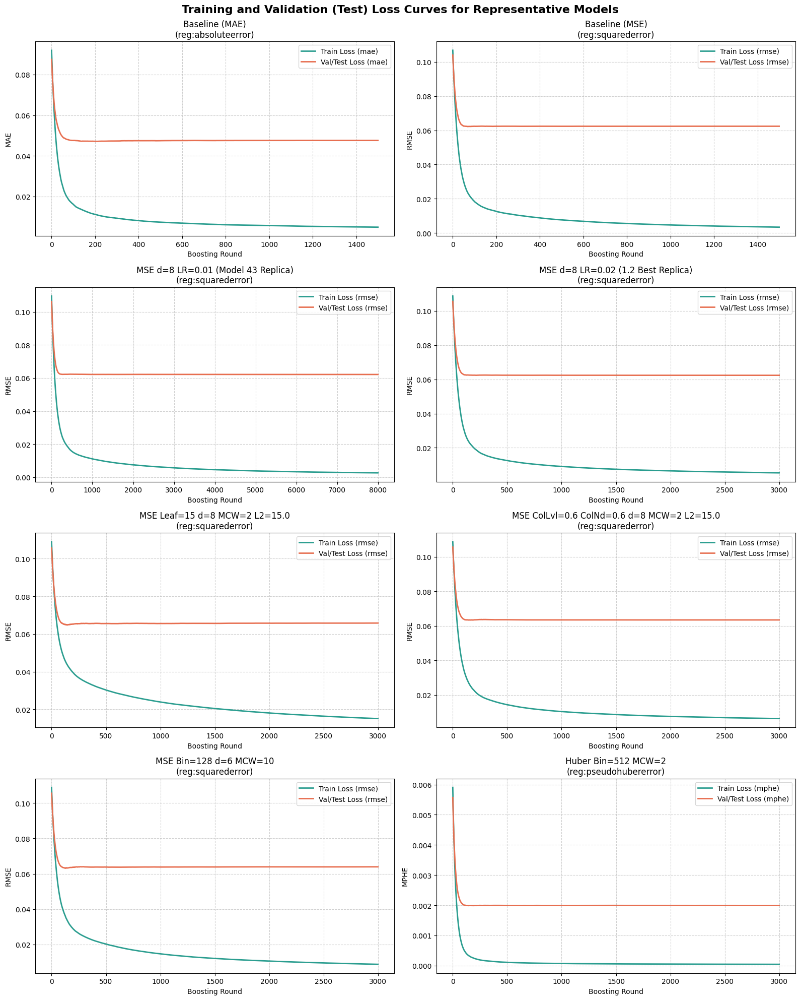

In [5]:
# Plot training vs validation loss curves for 8 selected representative models (4 rows, 2 columns)
selected_loss_models = [0, 1, 2, 9, 25, 65, 105, 118]
fig, axes = plt.subplots(4, 2, figsize=(16, 20))
axes = axes.flatten()

for i, mid in enumerate(selected_loss_models):
    config = next(c for c in MODELS_CONFIG if c["id"] == mid)
    model_name = config["name"]
    evals = evals_results[mid]
    metric_key = list(evals["validation_0"].keys())[0]
    
    train_loss = evals["validation_0"][metric_key]
    val_loss = evals["validation_1"][metric_key]
    
    ax = axes[i]
    ax.plot(train_loss, label=f"Train Loss ({metric_key})", color="#2a9d8f", linewidth=2)
    ax.plot(val_loss, label=f"Val/Test Loss ({metric_key})", color="#e76f51", linewidth=2)
    ax.set_xlabel("Boosting Round")
    ax.set_ylabel(metric_key.upper())
    ax.set_title(f"{model_name}\n({config['objective']})")
    ax.grid(True, linestyle="--", alpha=0.6)
    ax.legend()

plt.suptitle("Training and Validation (Test) Loss Curves for Representative Models", fontsize=16, fontweight="bold", y=0.99)
plt.tight_layout()
plt.savefig(out_dir / "loss_curves.png", dpi=300)
plt.show()


# Section 5: Metric Evaluation & Timing Summary

In this section, we evaluate the overall performance of all 120 model configurations on the held-out test split. We compute key statistical metrics ($R^2$, RMSE, ubRMSE, Bias, MAE, Median Absolute Error, and Pearson correlation) along with the recorded training and inference times. The results are compiled into a unified comparison table and saved to `metrics_summary.csv`.


In [6]:
# Define compute_metrics utility
def compute_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).ravel()
    y_pred = np.asarray(y_pred).ravel()
    err = y_true - y_pred
    ae = np.abs(err)
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = root_mean_squared_error(y_true, y_pred)
    ubrmse = np.sqrt(np.mean(((y_true - np.mean(y_true)) - (y_pred - np.mean(y_pred))) ** 2))
    bias = np.mean(err)
    med_ae = np.median(ae)
    if np.std(y_true) == 0 or np.std(y_pred) == 0:
        pearson = float("nan")
    else:
        pearson = np.corrcoef(y_true, y_pred)[0, 1]
    return {
        "R2": r2, "RMSE": rmse, "ubRMSE": ubrmse, "Bias": bias, "MAE": mae, "Med|Err|": med_ae, "Pearson": pearson
    }

# Compile summary metrics
summary_records = []
for config in MODELS_CONFIG:
    model_id = config["id"]
    model_name = config["name"]
    preds = test_predictions_df[f"pred_{model_id}"]
    
    metrics = compute_metrics(y_test, preds)
    metrics["Configuration"] = model_name
    metrics["Train Time (s)"] = config["train_time_s"]
    metrics["Inference Time (s)"] = config["inference_time_s"]
    summary_records.append(metrics)

summary_df = pd.DataFrame(summary_records)
# Reorder columns
cols_order = ["Configuration", "R2", "RMSE", "ubRMSE", "Bias", "MAE", "Med|Err|", "Pearson", "Train Time (s)", "Inference Time (s)"]
summary_df = summary_df[cols_order]

summary_df.to_csv(out_dir / "metrics_summary.csv", index=False)
print("===== COMPARATIVE PERFORMANCE & TIMING SUMMARY =====")
print(summary_df.to_string(index=False, formatters={
    'R2': '{:,.4f}'.format,
    'RMSE': '{:,.4f}'.format,
    'ubRMSE': '{:,.4f}'.format,
    'Bias': '{:+,.4f}'.format,
    'MAE': '{:,.4f}'.format,
    'Med|Err|': '{:,.4f}'.format,
    'Pearson': '{:,.4f}'.format,
    'Train Time (s)': '{:,.2f}'.format,
    'Inference Time (s)': '{:,.4f}'.format
}))

===== COMPARATIVE PERFORMANCE & TIMING SUMMARY =====
                              Configuration     R2   RMSE ubRMSE    Bias    MAE Med|Err| Pearson Train Time (s) Inference Time (s)
                             Baseline (MAE) 0.6454 0.0627 0.0590 -0.0213 0.0476   0.0366  0.8314          11.65             0.1096
                             Baseline (MSE) 0.6492 0.0624 0.0588 -0.0209 0.0469   0.0355  0.8339          10.17             0.1015
         MSE d=8 LR=0.01 (Model 43 Replica) 0.6518 0.0621 0.0585 -0.0211 0.0467   0.0356  0.8356          54.02             0.4597
       MSE d=8 LR=0.01 (Mod 43 Reg Replica) 0.6512 0.0622 0.0585 -0.0211 0.0468   0.0355  0.8357          50.78             0.5012
         MSE d=8 LR=0.04 (Model 14 Replica) 0.6517 0.0621 0.0585 -0.0209 0.0467   0.0357  0.8350           9.94             0.1039
         MSE d=8 LR=0.04 (Model 16 Replica) 0.6512 0.0622 0.0585 -0.0212 0.0466   0.0355  0.8353          10.01             0.1065
         Huber Slope 3.0 (Mode

# Section 6: Overall Residual Plots

This section generates a comprehensive grid comparison of residuals across all 120 configurations. Residuals are plotted as a function of the true soil moisture value (True vs. Residual) to diagnose structural underfitting (mean regression) and error distributions. The resulting figure is saved as `residuals_comparison.png`.


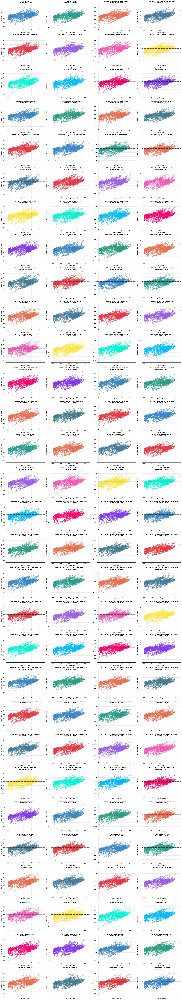

In [7]:
# Plot residuals comparison (30 rows, 4 columns = 120 axes)
fig, axes = plt.subplots(30, 4, figsize=(22, 120))
axes = axes.flatten()

# Curate some distinct colors for the plots
colors_palette = [
    '#3a86c8', '#2a9d8f', '#e76f51', '#457b9d', '#e63946', '#9b5de5', '#f15bb5', '#fee440', '#00f5d4',
    '#00bbf9', '#ff006e', '#8338ec', '#3a86c0', '#2a9d80', '#e76f50', '#457b90', '#e63940'
]

for i, config in enumerate(MODELS_CONFIG):
    model_id = config["id"]
    model_name = config["name"]
    preds = test_predictions_df[f"pred_{model_id}"]
    res = y_test - preds
    r2_val = r2_score(y_test, preds)
    
    ax = axes[i]
    ax.scatter(y_test, res, s=6, alpha=0.4, color=colors_palette[i % len(colors_palette)])
    ax.axhline(0, color='black', linestyle='--', linewidth=1.2, alpha=0.8)
    ax.set_xlabel("True Soil Moisture", fontsize=9)
    ax.set_ylabel("Residual (True - Pred)", fontsize=9)
    ax.set_title(f"{model_name}\nOverall R2 = {r2_val:.4f}", fontsize=10, fontweight='bold')
    ax.grid(alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# Hide any remaining unused subplots (if any)
for j in range(len(MODELS_CONFIG), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig(out_dir / "residuals_comparison.png", dpi=150)
plt.show()


# Section 7: Year-by-Year Performance Evaluation & Residuals

In this section, we evaluate each of the 120 configurations separately on each test year (2023, 2024, and 2025) to understand their temporal generalization consistency. We calculate yearly performance metrics and compile them into `metrics_by_year.csv`. To keep the visualization manageable and save memory, we select a representative subset of 7 configurations (representing the baselines and each sweep group) to plot the residuals by year in a 7x3 grid saved as `residuals_by_year.png`.


Test years identified: [np.float64(2023.0), np.float64(2024.0), np.float64(2025.0)]



===== YEAR 2023 BASELINES & SAMPLE PERFORMANCES =====
 Year                      Configuration     R2   RMSE ubRMSE    Bias    MAE Med|Err| Pearson
 2023                     Baseline (MAE) 0.6286 0.0656 0.0569 -0.0327 0.0509   0.0405  0.8505
 2023                     Baseline (MSE) 0.6421 0.0644 0.0565 -0.0308 0.0503   0.0406  0.8530
 2023 MSE d=8 LR=0.01 (Model 43 Replica) 0.6530 0.0634 0.0556 -0.0304 0.0494   0.0408  0.8576
 2023 MSE d=8 LR=0.02 (1.2 Best Replica) 0.6510 0.0636 0.0562 -0.0296 0.0495   0.0410  0.8544

===== YEAR 2024 BASELINES & SAMPLE PERFORMANCES =====
 Year                      Configuration     R2   RMSE ubRMSE    Bias    MAE Med|Err| Pearson
 2024                     Baseline (MAE) 0.6427 0.0597 0.0572 -0.0171 0.0445   0.0350  0.8300
 2024                     Baseline (MSE) 0.6391 0.0600 0.0568 -0.0191 0.0442   0.0339  0.8314
 2024 MSE d=8 LR=0.01 (Model 43 Replica) 0.6377 0.0601 0.0565 -0.0204 0.0443   0.0342  0.8334
 2024 MSE d=8 LR=0.02 (1.2 Best Replica) 0.6

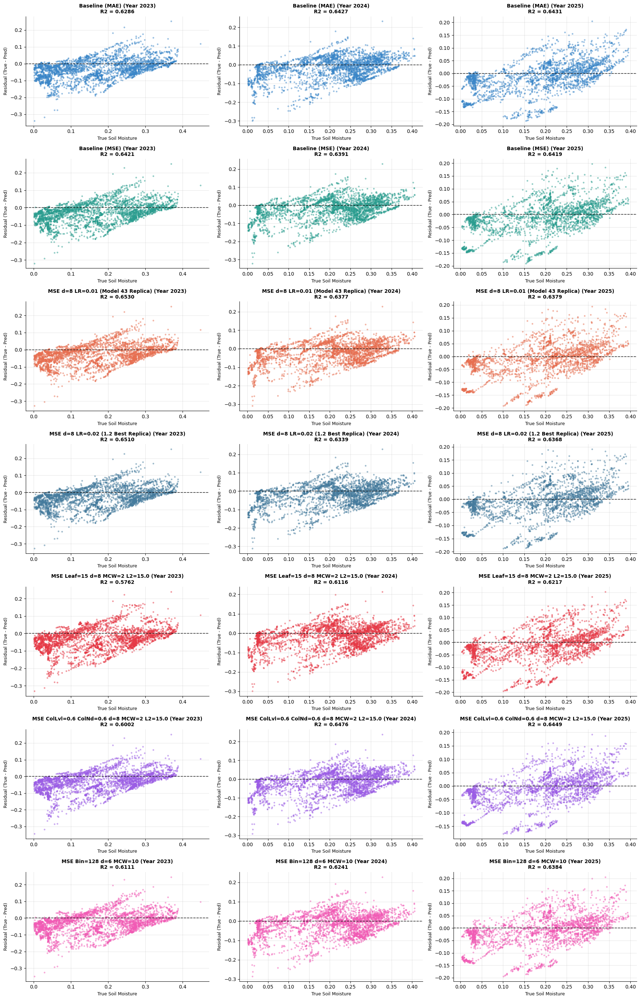

In [8]:
# Identify unique test years
test_years = sorted(test_predictions_df["year"].unique())
print(f"Test years identified: {test_years}")

yearly_records = []

for yr in test_years:
    df_yr = test_df[test_df["year"] == yr].reset_index(drop=True)
    y_test_yr = np.asarray(df_yr[TARGET_COL]).ravel()
    
    for config in MODELS_CONFIG:
        model_id = config["id"]
        model_name = config["name"]
        preds_yr = test_predictions_df[test_predictions_df["year"] == yr][f"pred_{model_id}"].values
        
        metrics_yr = compute_metrics(y_test_yr, preds_yr)
        metrics_yr["Year"] = int(yr)
        metrics_yr["Configuration"] = model_name
        yearly_records.append(metrics_yr)

yearly_summary_df = pd.DataFrame(yearly_records)
# Reorder columns
cols_order_yr = ["Year", "Configuration", "R2", "RMSE", "ubRMSE", "Bias", "MAE", "Med|Err|", "Pearson"]
yearly_summary_df = yearly_summary_df[cols_order_yr]

# Print yearly metrics breakdown for baseline models as a reference
for yr in test_years:
    print(f"\n===== YEAR {int(yr)} BASELINES & SAMPLE PERFORMANCES =====")
    df_yr_m = yearly_summary_df[(yearly_summary_df["Year"] == int(yr)) & (yearly_summary_df["Configuration"].isin([
        "Baseline (MAE)", "Baseline (MSE)", "MSE d=8 LR=0.01 (Model 43 Replica)", "MSE d=8 LR=0.02 (1.2 Best Replica)"
    ]))]
    print(df_yr_m.to_string(index=False, formatters={
        'R2': '{:,.4f}'.format,
        'RMSE': '{:,.4f}'.format,
        'ubRMSE': '{:,.4f}'.format,
        'Bias': '{:+,.4f}'.format,
        'MAE': '{:,.4f}'.format,
        'Med|Err|': '{:,.4f}'.format,
        'Pearson': '{:,.4f}'.format
    }))

yearly_summary_df.to_csv(out_dir / "metrics_by_year.csv", index=False)

# Plot residuals by year for 7 selected representative models (7 rows, 3 columns = 21 axes)
selected_subset = [0, 1, 2, 9, 25, 65, 105] # MAE, MSE, Model 43, Model 3, Leaf-wise, Colsample, Max bin
fig, axes = plt.subplots(len(selected_subset), 3, figsize=(18, 28))

# Curate colors matching the models
colors_palette = [
    '#3a86c8', '#2a9d8f', '#e76f51', '#457b9d', '#e63946', '#9b5de5', '#f15bb5'
]

for r_idx, model_id in enumerate(selected_subset):
    config = next(c for c in MODELS_CONFIG if c["id"] == model_id)
    model_name = config["name"]
    
    for col, yr in enumerate(test_years):
        df_yr = test_df[test_df["year"] == yr].reset_index(drop=True)
        y_test_yr = np.asarray(df_yr[TARGET_COL]).ravel()
        preds_yr = test_predictions_df[test_predictions_df["year"] == yr][f"pred_{model_id}"].values
        res_yr = y_test_yr - preds_yr
        r2_yr = r2_score(y_test_yr, preds_yr)
        
        ax = axes[r_idx, col]
        ax.scatter(y_test_yr, res_yr, s=6, alpha=0.4, color=colors_palette[r_idx % len(colors_palette)])
        ax.axhline(0, color='black', linestyle='--', linewidth=1.2, alpha=0.8)
        ax.set_xlabel("True Soil Moisture", fontsize=9)
        ax.set_ylabel("Residual (True - Pred)", fontsize=9)
        ax.set_title(f"{model_name} (Year {int(yr)})\nR2 = {r2_yr:.4f}", fontsize=10, fontweight='bold')
        ax.grid(alpha=0.3)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig(out_dir / "residuals_by_year.png", dpi=150)
plt.show()


# Section 8: Year-by-Year R2 Trend Visualization

To evaluate and compare all 118 new configurations alongside the two baselines, we organize them into 4 distinct plots matching their configuration groups:
1. **Group A**: Leaf-Wise Growth Policy Sweep (max_leaves, max_depth, MCW, reg_lambda sweep).
2. **Group B**: Granular Column Subsampling Sweep (colsample_bylevel, colsample_bynode, depth, MCW, reg_lambda sweep).
3. **Group C**: Max Binning Discretization Sweep (max_bin, depth, MCW sweep).
4. **Group D (Replications)**: Baseline and 1.1 top performer replications under optimized tree budgets.

The baseline MAE and MSE are plotted on all charts as references. The R2 trends are visualized in a 2x2 layout saved as `r2_by_year.png`.


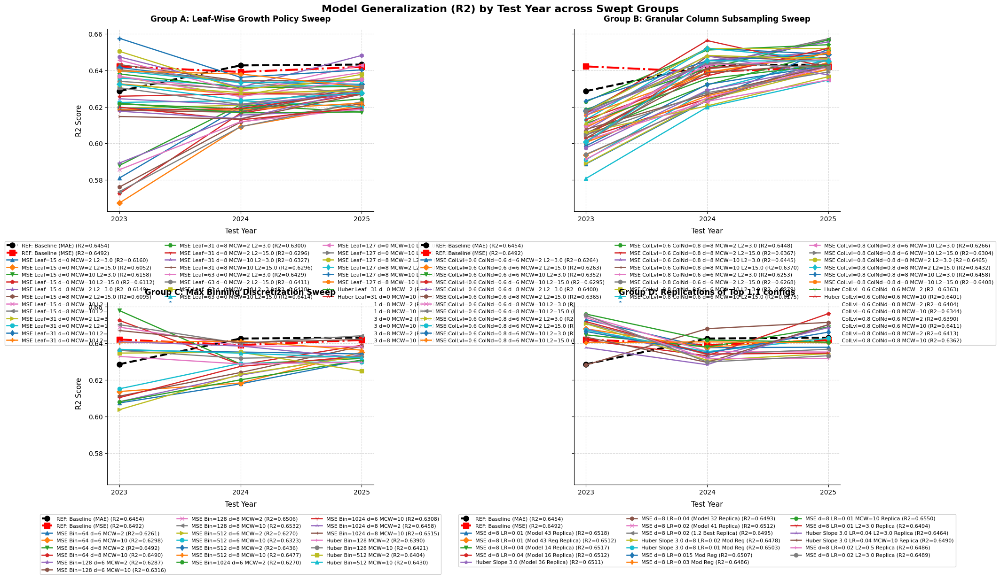

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(20, 14), sharey=True)
axes = axes.flatten()

# Define groupings
group_A_ids = list(range(20, 60))
group_B_ids = list(range(60, 100))
group_C_ids = list(range(100, 120))
group_D_ids = list(range(2, 20))

groupings = [
    ("Group A: Leaf-Wise Growth Policy Sweep", group_A_ids, axes[0]),
    ("Group B: Granular Column Subsampling Sweep", group_B_ids, axes[1]),
    ("Group C: Max Binning Discretization Sweep", group_C_ids, axes[2]),
    ("Group D: Replications of Top 1.1 configs", group_D_ids, axes[3])
]

# Set up unique markers
markers = ['o', 's', '^', 'D', 'v', 'p', '*', 'h', 'x', '<', '>', '8', 'd', 'P', 'H', '1', '2', '3', '4']

for r_idx, (title, ids, ax) in enumerate(groupings):
    # Always include Model 0 (MAE Baseline) and Model 1 (MSE Baseline) for reference
    reference_ids = [0, 1] + ids
    
    for idx, model_id in enumerate(reference_ids):
        config = next(c for c in MODELS_CONFIG if c["id"] == model_id)
        model_name = config["name"]
        
        # Retrieve yearly performance
        df_model = yearly_summary_df[yearly_summary_df["Configuration"] == model_name].sort_values("Year")
        years = df_model["Year"].values
        r2_vals = df_model["R2"].values
        
        # Retrieve overall R2 for the legend
        overall_r2 = summary_df[summary_df["Configuration"] == model_name]["R2"].values[0]
        
        # Format baseline models differently to stand out
        if model_id == 0:
            ax.plot(years, r2_vals, marker='o', markersize=8, linewidth=3.0, linestyle='--', color='black',
                    label=f"REF: Baseline (MAE) (R2={overall_r2:.4f})")
        elif model_id == 1:
            ax.plot(years, r2_vals, marker='s', markersize=8, linewidth=3.0, linestyle='-.', color='red',
                    label=f"REF: Baseline (MSE) (R2={overall_r2:.4f})")
        else:
            ax.plot(years, r2_vals, marker=markers[idx % len(markers)], markersize=6, linewidth=1.8,
                    label=f"{model_name} (R2={overall_r2:.4f})")
        
    ax.set_xticks(test_years)
    ax.set_xticklabels([str(int(y)) for y in test_years])
    ax.set_xlabel("Test Year", fontsize=11, labelpad=8)
    ax.set_title(title, fontsize=12, fontweight='bold', pad=12)
    ax.grid(True, linestyle='--', alpha=0.5)
    
    # Position legends dynamically depending on the group size to avoid clutter
    ncol_leg = 3 if len(ids) > 15 else (2 if len(ids) > 8 else 1)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=ncol_leg, 
              frameon=True, facecolor='white', framealpha=0.9, fontsize=8)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

axes[0].set_ylabel("R2 Score", fontsize=11, labelpad=8)
axes[2].set_ylabel("R2 Score", fontsize=11, labelpad=8)

plt.suptitle("Model Generalization (R2) by Test Year across Swept Groups", fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.subplots_adjust(bottom=0.25, hspace=0.5)
plt.savefig(out_dir / "r2_by_year.png", dpi=300)
plt.show()
